In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from statsmodels.stats.multicomp import pairwise_tukeyhsd

In [2]:
df_wines = pd.read_csv('wine-quality/wine_quality_combined.csv')
df_red = pd.read_csv('wine-quality/wine_quality_red.csv')
df_white = pd.read_csv('wine-quality/wine_quality_white.csv')
wine_properties = list(df_wines.columns[:-3])

In [5]:
df_wines.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000
mean,7.215307,0.339666,0.318633,5.443235,0.056034,30.525319,115.744574,0.994697,3.218501,0.531268,10.491801,5.818378
std,1.296434,0.164636,0.145318,4.757804,0.035034,17.749400,56.521855,0.002999,0.160787,0.148806,1.192712,0.873255
min,3.800000,0.080000,0.000000,0.600000,0.009000,1.000000,6.000000,0.987110,2.720000,0.220000,8.000000,3.000000
25%,6.400000,0.230000,0.250000,1.800000,0.038000,17.000000,77.000000,0.992340,3.110000,0.430000,9.500000,5.000000
50%,7.000000,0.290000,0.310000,3.000000,0.047000,29.000000,118.000000,0.994890,3.210000,0.510000,10.300000,6.000000
75%,7.700000,0.400000,0.390000,8.100000,0.065000,41.000000,156.000000,0.996990,3.320000,0.600000,11.300000,6.000000
max,15.900000,1.580000,1.660000,65.800000,0.611000,289.000000,440.000000,1.038980,4.010000,2.000000,14.900000,9.000000


In [4]:
F, p = stats.f_oneway(df_wines[df_wines['quality_label'] == 'low']['alcohol'],
df_wines[df_wines['quality_label'] == 'medium']['alcohol'],
df_wines[df_wines['quality_label'] == 'high']['alcohol'])
print('ANOVA test for mean alcohol levels across wine samples with different quality ratings')
print('\n\nF Statistic:', F, '\tp-value:', p)
print('\n\n===========\n\n')

ANOVA test for mean alcohol levels across wine samples with different quality ratings


F Statistic: 673.0745347231032 	p-value: 2.2715337450621843e-266






import random
palettes = ['Accent', 'Accent_r', 'Blues', 'Blues_r', 'BrBG', 'BrBG_r', 'BuGn', 'BuGn_r', 'BuPu', 'BuPu_r', 'CMRmap', 'CMRmap_r', 'Dark2', 'Dark2_r', 'GnBu', 'GnBu_r', 'Greens', 'Greens_r', 'Greys', 'Greys_r', 'OrRd', 'OrRd_r', 'Oranges', 'Oranges_r', 'PRGn', 'PRGn_r', 'Paired', 'Paired_r', 'Pastel1', 'Pastel1_r', 'Pastel2', 'Pastel2_r', 'PiYG', 'PiYG_r', 'PuBu', 'PuBuGn', 'PuBuGn_r', 'PuBu_r', 'PuOr', 'PuOr_r', 'PuRd', 'PuRd_r', 'Purples', 'Purples_r', 'RdBu', 'RdBu_r', 'RdGy', 'RdGy_r', 'RdPu', 'RdPu_r', 'RdYlBu', 'RdYlBu_r', 'RdYlGn', 'RdYlGn_r', 'Reds', 'Reds_r', 'Set1', 'Set1_r', 'Set2', 'Set2_r', 'Set3', 'Set3_r', 'Spectral', 'Spectral_r', 'Wistia', 'Wistia_r', 'YlGn', 'YlGnBu', 'YlGnBu_r', 'YlGn_r', 'YlOrBr', 'YlOrBr_r', 'YlOrRd', 'YlOrRd_r', 'afmhot', 'afmhot_r', 'autumn', 'autumn_r', 'binary', 'binary_r', 'bone', 'bone_r', 'brg', 'brg_r', 'bwr', 'bwr_r', 'cividis', 'cividis_r', 'cool', 'cool_r', 'coolwarm', 'coolwarm_r', 'copper', 'copper_r', 'crest', 'crest_r', 'cubehelix', 'cubehelix_r', 'flare', 'flare_r', 'gist_earth', 'gist_earth_r', 'gist_gray', 'gist_gray_r', 'gist_heat', 'gist_heat_r', 'gist_ncar', 'gist_ncar_r', 'gist_rainbow', 'gist_rainbow_r', 'gist_stern', 'gist_stern_r', 'gist_yarg', 'gist_yarg_r', 'gnuplot', 'gnuplot2', 'gnuplot2_r', 'gnuplot_r','hot', 'hot_r', 'hsv', 'hsv_r', 'icefire', 'icefire_r', 'inferno', 'inferno_r', 'jet', 'jet_r', 'magma', 'magma_r', 'mako', 'mako_r', 'nipy_spectral', 'nipy_spectral_r', 'ocean', 'ocean_r', 'pink', 'pink_r', 'plasma', 'plasma_r', 'prism', 'prism_r', 'rainbow', 'rainbow_r', 'rocket', 'rocket_r', 'seismic', 'seismic_r', 'spring', 'spring_r', 'summer', 'summer_r', 'tab20', 'tab20_r', 'tab20b', 'tab20b_r', 'tab20c', 'tab20c_r', 'terrain', 'terrain_r', 'turbo', 'turbo_r', 'twilight', 'twilight_r', 'twilight_shifted', 'twilight_shifted_r', 'viridis', 'viridis_r', 'vlag', 'vlag_r', 'winter', 'winter_r']
random.choice(palettes)

for palette in palettes:
    try:
        print(palette)
        display(sns.color_palette(palette))
    except:
        pass

sns.color_palette('nipy_spectral_r',3,0.8)

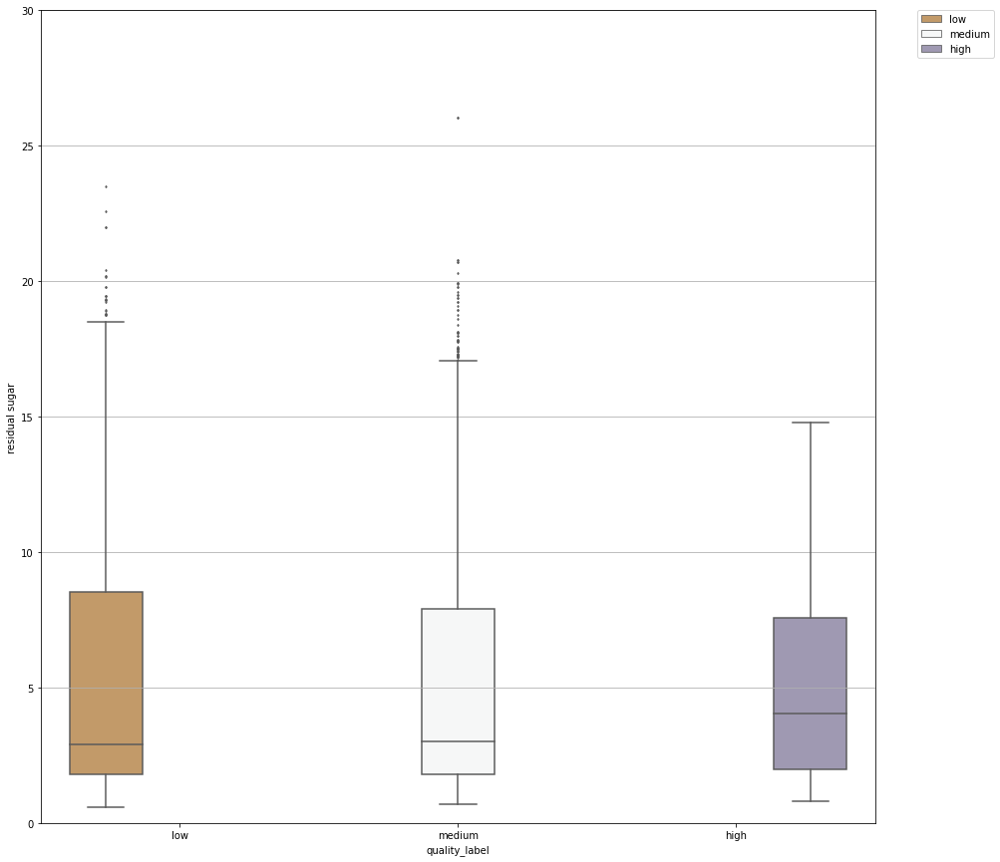

In [16]:
fig, ax = plt.subplots(nrows=1, ncols = 1,figsize=(15,15))
fig.patch.set_facecolor('white')
sns.boxplot(data = df_wines,x='quality_label',y='residual sugar', hue='quality_label',palette = 'PuOr',fliersize = 1.5,saturation = 0.5, ax = ax)
ax.set_ybound(0.0,30.0)
ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
ax.grid(b=True, which='both', axis='y')
plt.savefig('plots/residual sugar_box.png')

fig, ax = plt.subplots(nrows=1, ncols = 1)
fig.patch.set_facecolor('white')
sns.violinplot(data = df_wines,x='quality_label',y='fixed acidity',scale='', hue='quality_label',palette = 'nipy_spectral_r', inner='box', ax = ax)
ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
ax.grid(b=True, which='both', axis='y')

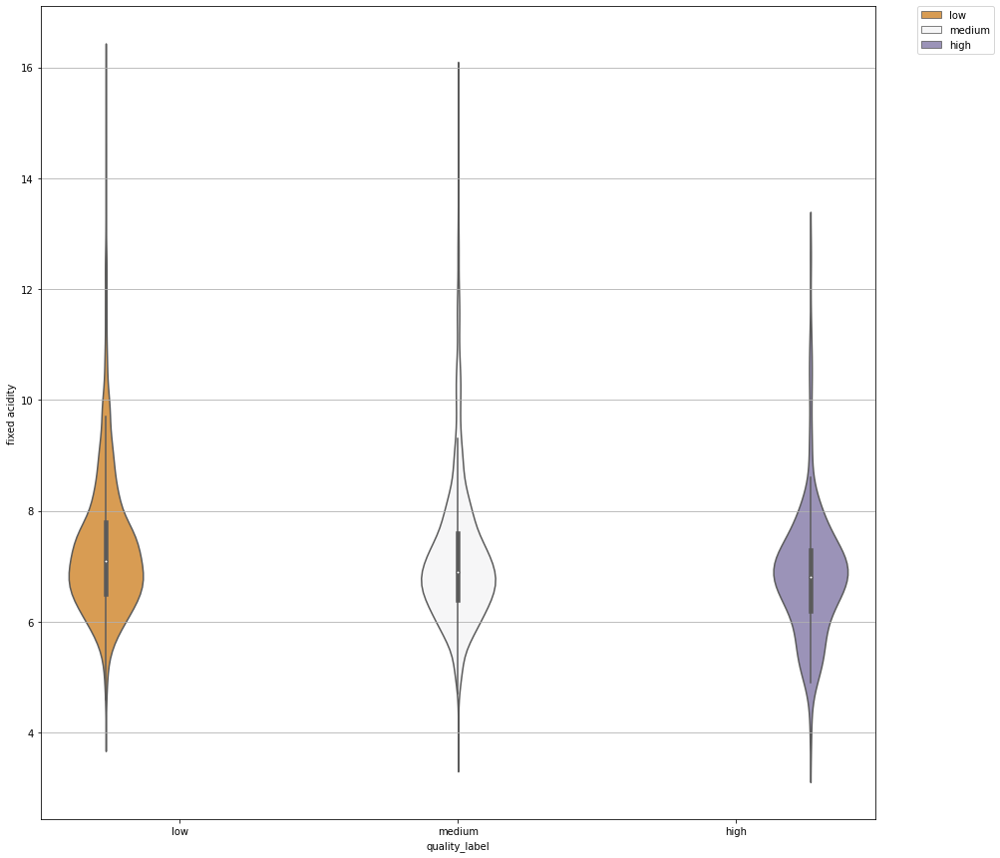

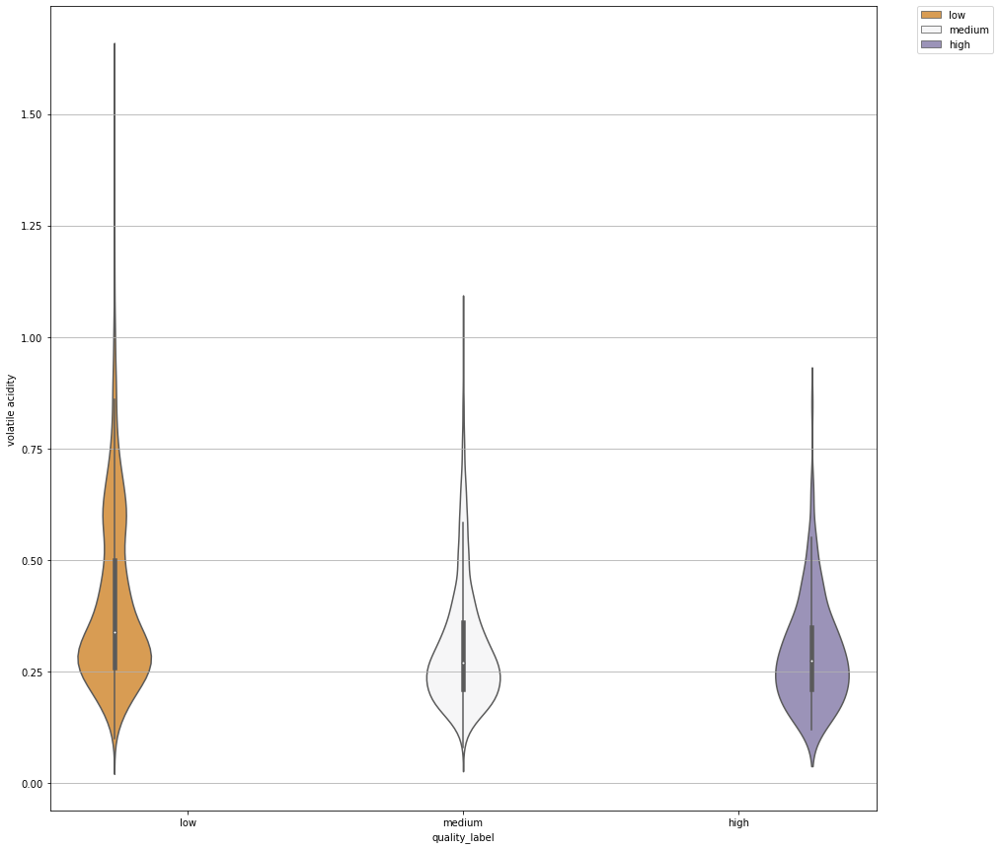

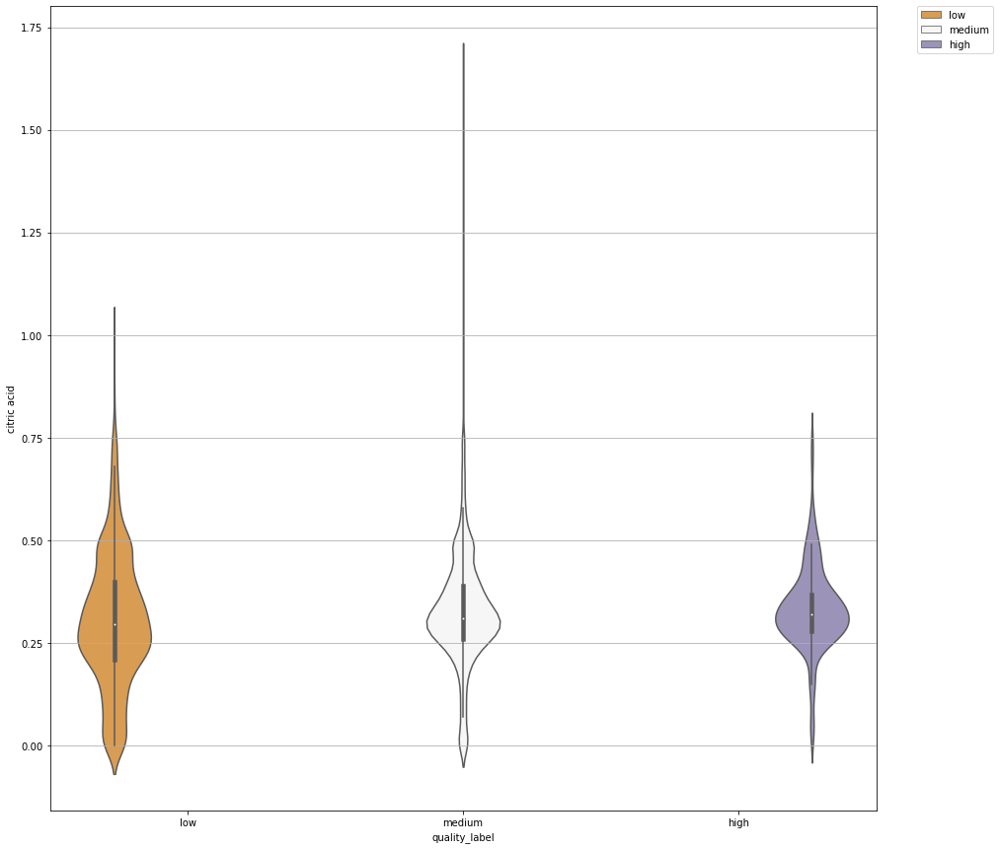

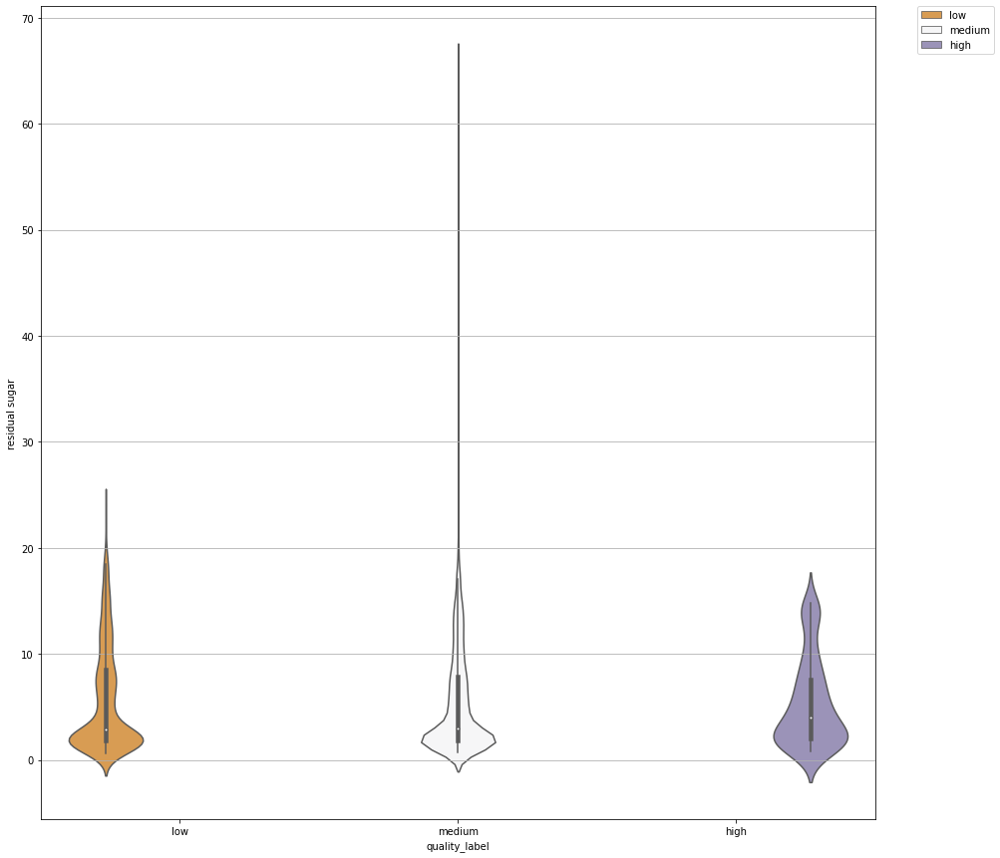

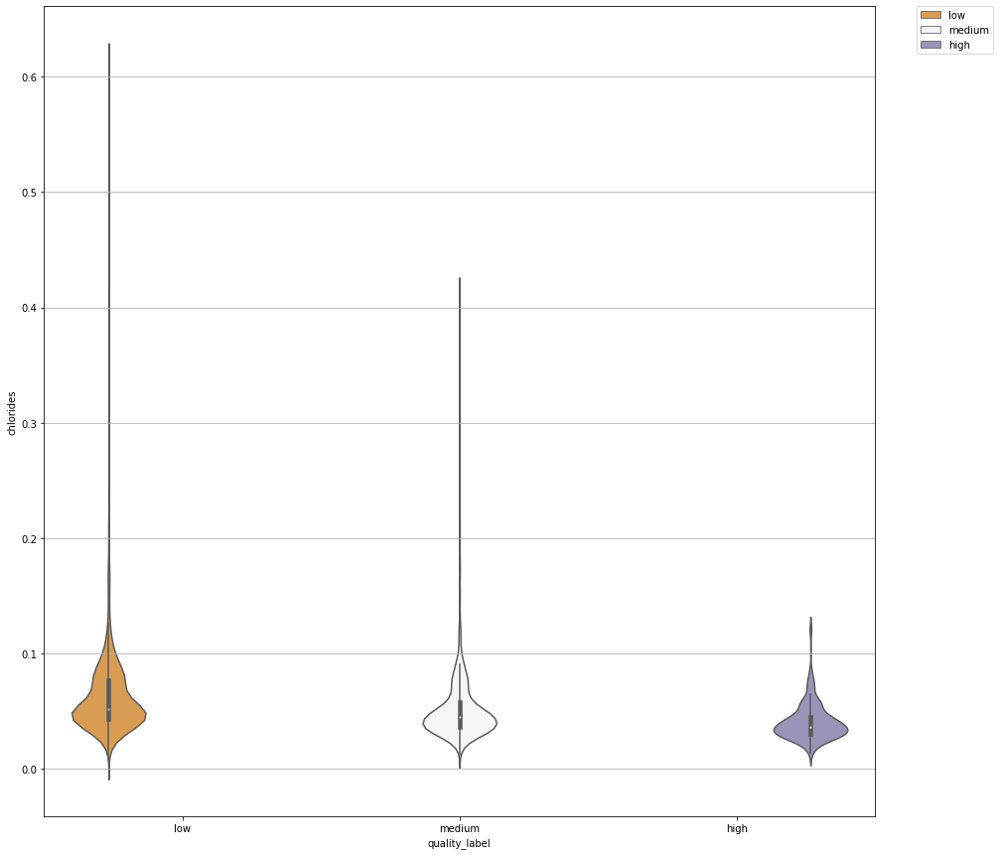

...

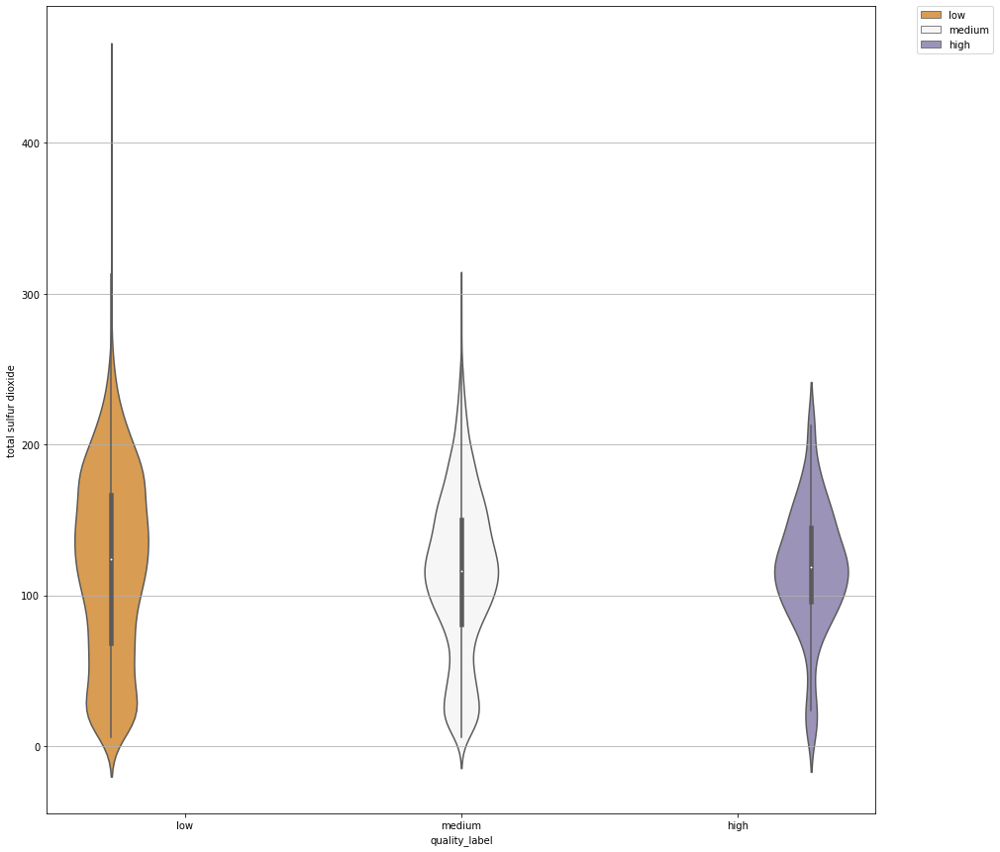

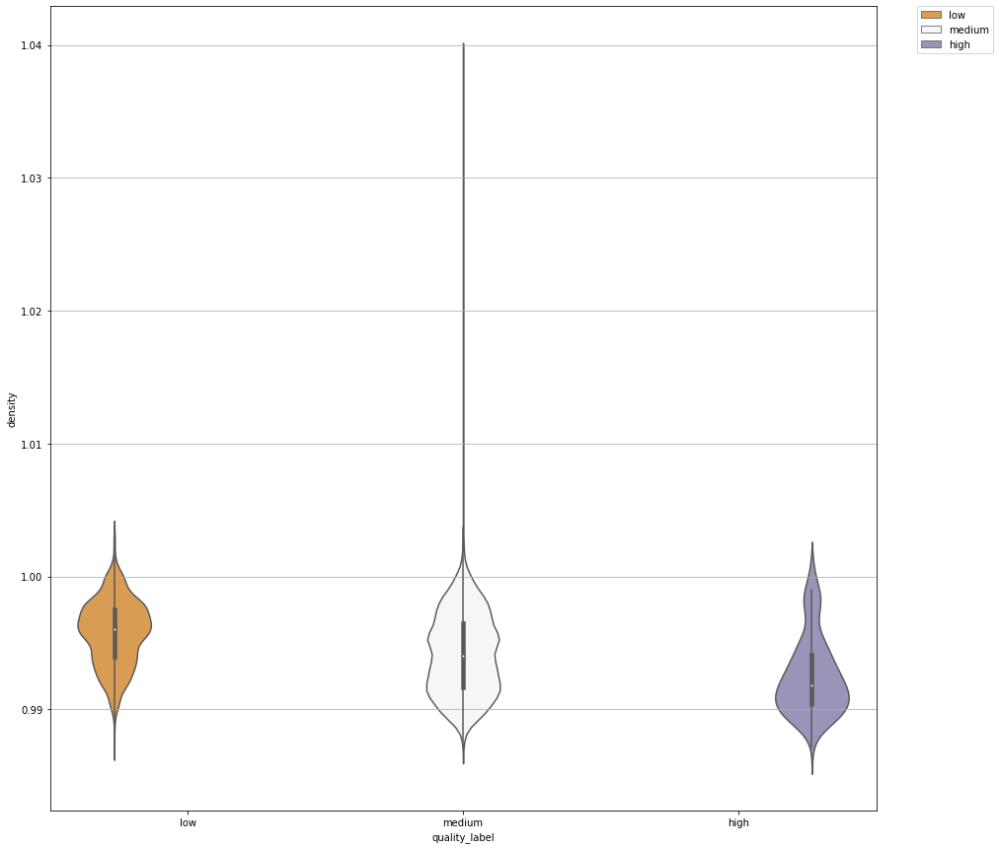

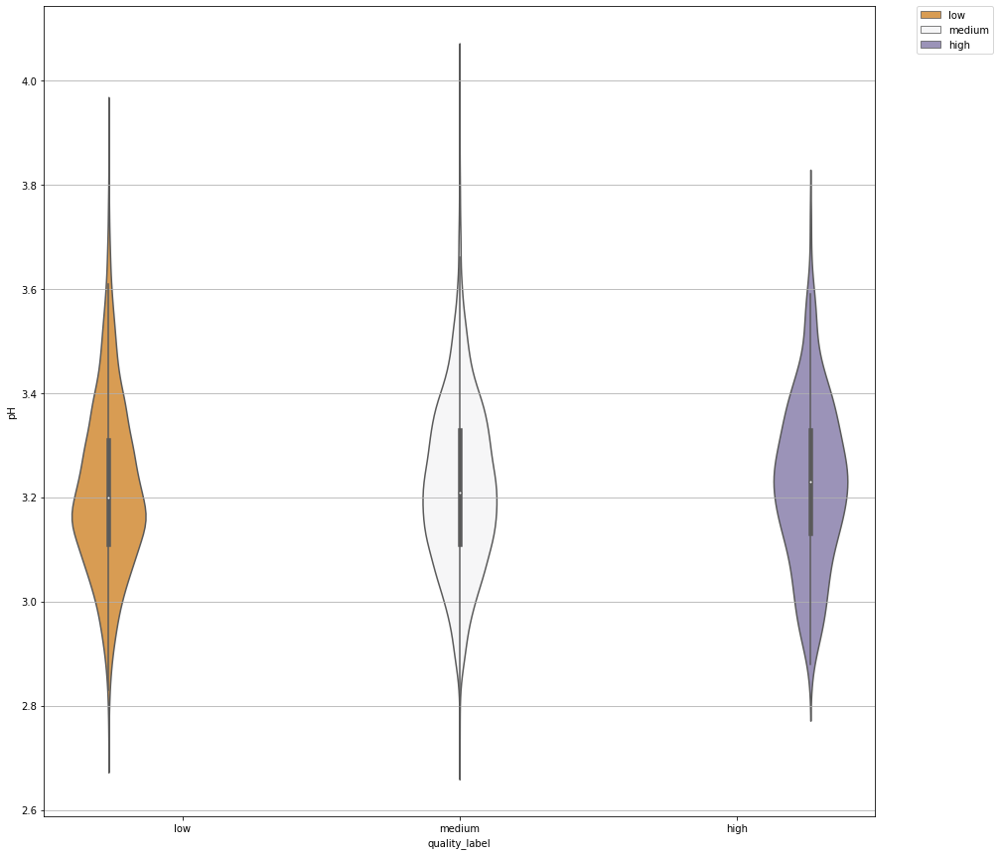

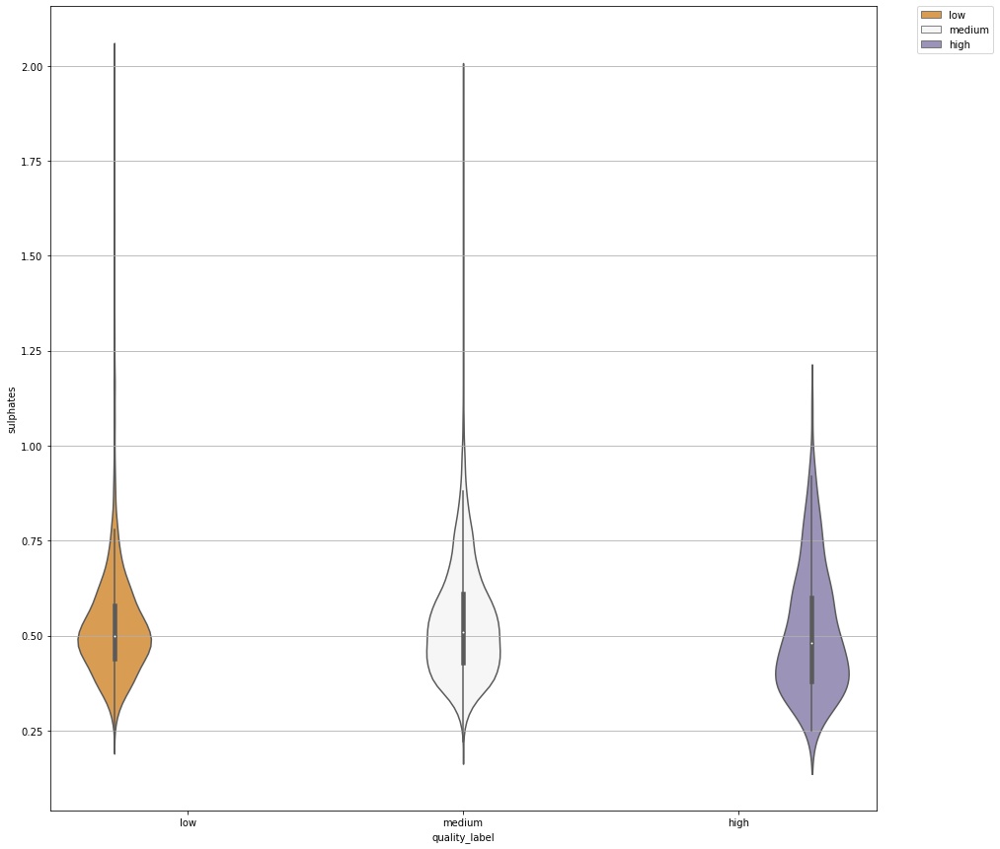

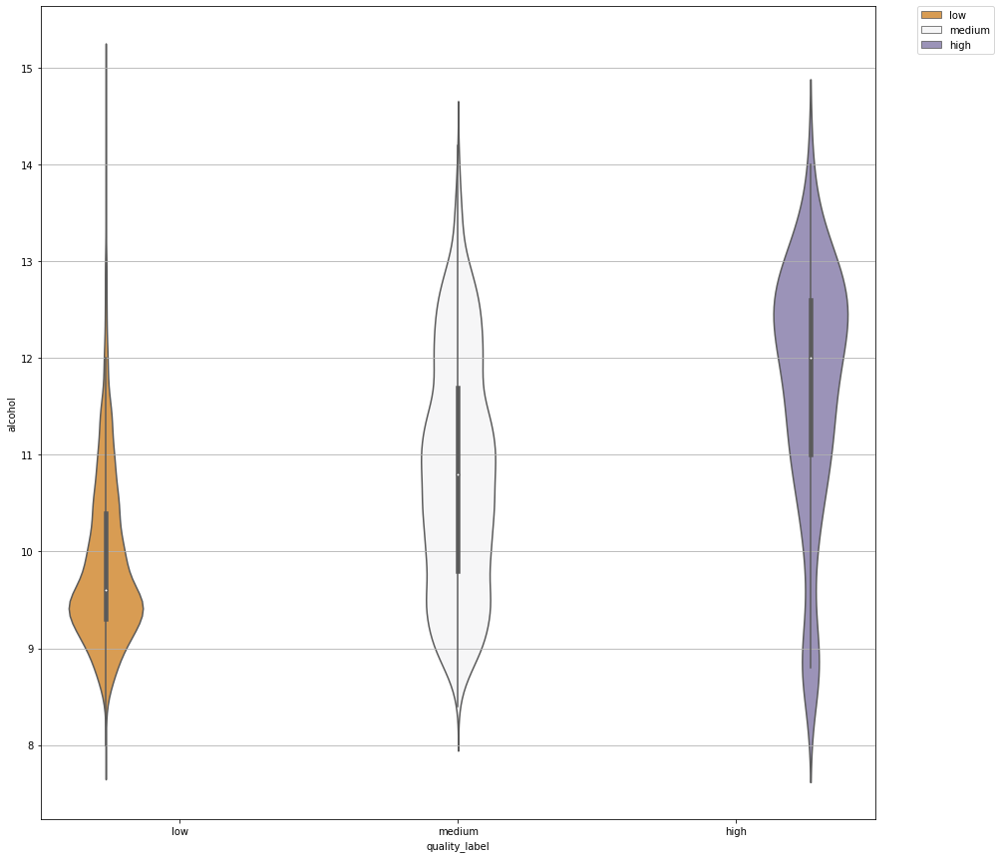

In [8]:
list_features = list(df_wines.columns[:-3])
for ind,feature in enumerate(list_features):
    fig, ax = plt.subplots(nrows=1, ncols = 1,figsize = (15,15))
    fig.patch.set_facecolor('white')
    sns.violinplot(data = df_wines,x='quality_label',y=f'{feature}', hue='quality_label',palette = 'PuOr', inner='box', ax = ax)
    ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
    ax.grid(b=True, which='both', axis='y')
    plt.savefig(f'plots/{feature}_by_quality_label.png')

plt.style.use('seaborn')
list_features = list(df_wines.columns[:-3])
fig, axes = plt.subplots(nrows = len(list_features), ncols  = 1, figsize = (10,60))
plt.subplots_adjust(hspace = 0.2)
for ind,feature in enumerate(list_features):
    data = [np.array(df_wines[df_wines['quality_label'] == label][feature]) for label in list(df_wines.quality_label.unique())]
    axes[ind].violinplot(data,showmeans = True, showmedians = False)
    axes[ind].set_xlabel('Wine Quality')
    axes[ind].set_ylabel(feature.capitalize())
    axes[ind].set_xticks([i+1 for i in range(3)])
    axes[ind].set_xticklabels([label.capitalize() for label in list(df_wines.quality_label.unique())])
    # print('\n\n\n\n\n')
# for ax in axes:
# plt.setp(axes, xticks = [i+1 for i in range(3)],xticklabels=list(df_wines.quality_label.unique()))
plt.savefig('figures.png')

$H_0$: There is no statistical difference between the means of different properties

In [ ]:
for prop in wine_properties:
    F, p = stats.f_oneway(df_wines[df_wines['quality_label'] == 'low'][f'{prop}'],
    df_wines[df_wines['quality_label'] == 'medium'][f'{prop}'],
    df_wines[df_wines['quality_label'] == 'high'][f'{prop}'])
    print(f'ANOVA test for mean {prop} levels across wine samples with different quality ratings')
    print('<br><br>F Statistic:', F, '\tp-value:', p)
    print('\n\n===========\n\n')

# Fixed acidity
ANOVA test for mean fixed acidity levels across wine samples with different quality ratings
<br>F Statistic: 20.38163849837651 	p-value: 1.4997963980511249e-09

# Volatile acidity
ANOVA test for mean volatile acidity levels across wine samples with different quality ratings
<br>F Statistic: 250.33914475322013 	p-value: 1.8472285967274535e-105

# Citric acid
ANOVA test for mean citric acid levels across wine samples with different quality ratings
<br>F Statistic: 18.968901422737094 	p-value: 6.1077442166569355e-09

# Residual sugar
ANOVA test for mean residual sugar levels across wine samples with different quality ratings
<br>F Statistic: 3.432938987382213 	p-value: 0.032350509691691995

# Chlorides
ANOVA test for mean chlorides levels across wine samples with different quality ratings
<br>F Statistic: 120.96013685200977 	p-value: 2.645627533466762e-52

# Free sulfur dioxide
ANOVA test for mean free sulfur dioxide levels across wine samples with different quality ratings
<br>F Statistic: 10.312540552928873 	p-value: 3.3761187237755544e-05

# Total sulfur dioxide
ANOVA test for mean total sulfur dioxide levels across wine samples with different quality ratings
<br>F Statistic: 7.836877117063729 	p-value: 0.0003986467534853219

# Density
ANOVA test for mean density levels across wine samples with different quality ratings
<br>F Statistic: 287.5901261740119 	p-value: 2.1186713255495357e-120

# pH
ANOVA test for mean pH levels across wine samples with different quality ratings
<br>F Statistic: 1.2363860803545195 	p-value: 0.2905002779768688


# Sulphates
ANOVA test for mean sulphates levels across wine samples with different quality ratings
<br>F Statistic: 6.884948526194737 	p-value: 0.0010305533421903841


# Alcohol
ANOVA test for mean alcohol levels across wine samples with different quality ratings
<br>F Statistic: 673.0745347231032 	p-value: 2.2715337450621843e-266

$H_0$ Rejected except for pH

Using pairwise TukeyHSD to compare pairs:

tukey_results = {}
for prop in wine_properties:
    tukey_results[prop]=pairwise_tukeyhsd(df_wines[prop],df_wines['quality_label'],0.05)

In [8]:
tukey_results

NameError: name 'tukey_results' is not defined

<style>
table:{
    padding: 25px;
}
td{
    padding: 15px;
}
</style>
<table style="padding: 25px"><caption>Multiple Comparison of Means - Tukey HSD, FWER=0.05</caption><tr>  <th>group1</th> <th>group2</th> <th>meandiff</th>  <th>p-adj</th>  <th>lower</th>   <th>upper</th> <th>reject</th></tr><tr>   <td>high</td>    <td>low</td>   <td>-0.0108</td> <td>0.6225</td> <td>-0.0387</td>  <td>0.017</td>  <td>False</td></tr><tr>   <td>high</td>  <td>medium</td>  <td>-0.0048</td>   <td>0.9</td>  <td>-0.0322</td> <td>0.0227</td>  <td>False</td></tr><tr>    <td>low</td>  <td>medium</td>  <td>0.0061</td>  <td>0.3161</td> <td>-0.0037</td> <td>0.0158</td>  <td>False</td></tr></table>

<table class="simpletable" style = "padding: 50px;"><caption>Multiple Comparison of Means - Tukey HSD, FWER=0.05</caption><tr>  <th>group1</th> <th>group2</th> <th>meandiff</th>  <th>p-adj</th>  <th>lower</th>   <th>upper</th> <th>reject</th></tr><tr>   <td>high</td>    <td>low</td>   <td>-0.0108</td> <td>0.6225</td> <td>-0.0387</td>  <td>0.017</td>  <td>False</td></tr><tr>   <td>high</td>  <td>medium</td>  <td>-0.0048</td>   <td>0.9</td>  <td>-0.0322</td> <td>0.0227</td>  <td>False</td></tr><tr>    <td>low</td>  <td>medium</td>  <td>0.0061</td>  <td>0.3161</td> <td>-0.0037</td> <td>0.0158</td>  <td>False</td></tr></table>

import re
for prop in wine_properties:
    print('# Pairwise analysis for ',prop.capitalize())
    display(tukey_results[prop].summary().as_html().replace('\n',''))
    print('\n\n***************\n\n')

<style>
table:{
    padding: 25px;
}
td, caption{
    padding: 15px;
}
</style>
# Pairwise analysis for  Fixed acidity
'<table class="simpletable"><caption>Multiple Comparison of Means - Tukey HSD, FWER=0.05</caption><tr>  <th>group1</th> <th>group2</th> <th>meandiff</th>  <th>p-adj</th>  <th>lower</th>   <th>upper</th>  <th>reject</th></tr><tr>   <td>high</td>    <td>low</td>    <td>0.48</td>    <td>0.001</td> <td>0.2559</td>  <td>0.7041</td>   <td>True</td> </tr><tr>   <td>high</td>  <td>medium</td>  <td>0.3139</td>  <td>0.0025</td> <td>0.0932</td>  <td>0.5347</td>   <td>True</td> </tr><tr>    <td>low</td>  <td>medium</td>  <td>-0.166</td>   <td>0.001</td> <td>-0.2448</td> <td>-0.0873</td>  <td>True</td> </tr></table>'


***************


# Pairwise analysis for  Volatile acidity
'<table class="simpletable"><caption>Multiple Comparison of Means - Tukey HSD, FWER=0.05</caption><tr>  <th>group1</th> <th>group2</th> <th>meandiff</th>  <th>p-adj</th>  <th>lower</th>   <th>upper</th>  <th>reject</th></tr><tr>   <td>high</td>    <td>low</td>   <td>0.1062</td>   <td>0.001</td> <td>0.0787</td>  <td>0.1337</td>   <td>True</td> </tr><tr>   <td>high</td>  <td>medium</td>  <td>0.0158</td>  <td>0.3608</td> <td>-0.0113</td> <td>0.0429</td>   <td>False</td></tr><tr>    <td>low</td>  <td>medium</td>  <td>-0.0905</td>  <td>0.001</td> <td>-0.1001</td> <td>-0.0808</td>  <td>True</td> </tr></table>'


***************


# Pairwise analysis for  Citric acid
'<table class="simpletable"><caption>Multiple Comparison of Means - Tukey HSD, FWER=0.05</caption><tr>  <th>group1</th> <th>group2</th> <th>meandiff</th>  <th>p-adj</th>  <th>lower</th>   <th>upper</th>  <th>reject</th></tr><tr>   <td>high</td>    <td>low</td>   <td>-0.0297</td> <td>0.0154</td> <td>-0.0548</td> <td>-0.0046</td>  <td>True</td> </tr><tr>   <td>high</td>  <td>medium</td>  <td>-0.0072</td>  <td>0.752</td> <td>-0.032</td>  <td>0.0175</td>   <td>False</td></tr><tr>    <td>low</td>  <td>medium</td>  <td>0.0225</td>   <td>0.001</td> <td>0.0137</td>  <td>0.0313</td>   <td>True</td> </tr></table>'


***************


# Pairwise analysis for  Residual sugar
'<table class="simpletable"><caption>Multiple Comparison of Means - Tukey HSD, FWER=0.05</caption><tr>  <th>group1</th> <th>group2</th> <th>meandiff</th>  <th>p-adj</th>  <th>lower</th>   <th>upper</th>  <th>reject</th></tr><tr>   <td>high</td>    <td>low</td>   <td>0.2952</td>  <td>0.6634</td> <td>-0.5294</td> <td>1.1198</td>   <td>False</td></tr><tr>   <td>high</td>  <td>medium</td>  <td>-0.0267</td>   <td>0.9</td>  <td>-0.8389</td> <td>0.7854</td>   <td>False</td></tr><tr>    <td>low</td>  <td>medium</td>  <td>-0.3219</td> <td>0.0249</td> <td>-0.6116</td> <td>-0.0323</td>  <td>True</td> </tr></table>'


***************


# Pairwise analysis for  Chlorides
'<table class="simpletable"><caption>Multiple Comparison of Means - Tukey HSD, FWER=0.05</caption><tr>  <th>group1</th> <th>group2</th> <th>meandiff</th> <th>p-adj</th>  <th>lower</th>   <th>upper</th>  <th>reject</th></tr><tr>   <td>high</td>    <td>low</td>   <td>0.0236</td>  <td>0.001</td> <td>0.0177</td>  <td>0.0296</td>   <td>True</td> </tr><tr>   <td>high</td>  <td>medium</td>  <td>0.0109</td>  <td>0.001</td> <td>0.0051</td>  <td>0.0168</td>   <td>True</td> </tr><tr>    <td>low</td>  <td>medium</td>  <td>-0.0127</td> <td>0.001</td> <td>-0.0148</td> <td>-0.0106</td>  <td>True</td> </tr></table>'


***************


# Pairwise analysis for  Free sulfur dioxide
'<table class="simpletable"><caption>Multiple Comparison of Means - Tukey HSD, FWER=0.05</caption><tr>  <th>group1</th> <th>group2</th> <th>meandiff</th>  <th>p-adj</th>  <th>lower</th>   <th>upper</th>  <th>reject</th></tr><tr>   <td>high</td>    <td>low</td>   <td>-5.0246</td>  <td>0.001</td> <td>-8.0975</td> <td>-1.9516</td>  <td>True</td> </tr><tr>   <td>high</td>  <td>medium</td>  <td>-3.5448</td> <td>0.0167</td> <td>-6.5713</td> <td>-0.5182</td>  <td>True</td> </tr><tr>    <td>low</td>  <td>medium</td>  <td>1.4798</td>  <td>0.0038</td> <td>0.4004</td>  <td>2.5592</td>   <td>True</td> </tr></table>'


***************


# Pairwise analysis for  Total sulfur dioxide
'<table class="simpletable"><caption>Multiple Comparison of Means - Tukey HSD, FWER=0.05</caption><tr>  <th>group1</th> <th>group2</th> <th>meandiff</th>  <th>p-adj</th>   <th>lower</th>   <th>upper</th>  <th>reject</th></tr><tr>   <td>high</td>    <td>low</td>   <td>1.7973</td>  <td>0.8973</td>  <td>-7.9921</td> <td>11.5867</td>  <td>False</td></tr><tr>   <td>high</td>  <td>medium</td>  <td>-3.9741</td> <td>0.5908</td> <td>-13.6155</td> <td>5.6674</td>   <td>False</td></tr><tr>    <td>low</td>  <td>medium</td>  <td>-5.7713</td>  <td>0.001</td>  <td>-9.2099</td> <td>-2.3327</td>  <td>True</td> </tr></table>'


***************


# Pairwise analysis for  Density
'<table class="simpletable"><caption>Multiple Comparison of Means - Tukey HSD, FWER=0.05</caption><tr>  <th>group1</th> <th>group2</th> <th>meandiff</th> <th>p-adj</th>  <th>lower</th>   <th>upper</th>  <th>reject</th></tr><tr>   <td>high</td>    <td>low</td>   <td>0.0033</td>  <td>0.001</td> <td>0.0028</td>  <td>0.0038</td>   <td>True</td> </tr><tr>   <td>high</td>  <td>medium</td>  <td>0.0017</td>  <td>0.001</td> <td>0.0012</td>  <td>0.0022</td>   <td>True</td> </tr><tr>    <td>low</td>  <td>medium</td>  <td>-0.0016</td> <td>0.001</td> <td>-0.0018</td> <td>-0.0014</td>  <td>True</td> </tr></table>'


***************


# Pairwise analysis for  pH
'<table class="simpletable"><caption>Multiple Comparison of Means - Tukey HSD, FWER=0.05</caption><tr>  <th>group1</th> <th>group2</th> <th>meandiff</th>  <th>p-adj</th>  <th>lower</th>   <th>upper</th> <th>reject</th></tr><tr>   <td>high</td>    <td>low</td>   <td>-0.0108</td> <td>0.6225</td> <td>-0.0387</td>  <td>0.017</td>  <td>False</td></tr><tr>   <td>high</td>  <td>medium</td>  <td>-0.0048</td>   <td>0.9</td>  <td>-0.0322</td> <td>0.0227</td>  <td>False</td></tr><tr>    <td>low</td>  <td>medium</td>  <td>0.0061</td>  <td>0.3161</td> <td>-0.0037</td> <td>0.0158</td>  <td>False</td></tr></table>'


***************


# Pairwise analysis for  Sulphates
'<table class="simpletable"><caption>Multiple Comparison of Means - Tukey HSD, FWER=0.05</caption><tr>  <th>group1</th> <th>group2</th> <th>meandiff</th>  <th>p-adj</th>  <th>lower</th>   <th>upper</th> <th>reject</th></tr><tr>   <td>high</td>    <td>low</td>    <td>0.013</td>   <td>0.468</td> <td>-0.0128</td> <td>0.0387</td>  <td>False</td></tr><tr>   <td>high</td>  <td>medium</td>  <td>0.0252</td>  <td>0.0519</td> <td>-0.0002</td> <td>0.0506</td>  <td>False</td></tr><tr>    <td>low</td>  <td>medium</td>  <td>0.0123</td>  <td>0.0043</td> <td>0.0032</td>  <td>0.0213</td>  <td>True</td> </tr></table>'


***************


# Pairwise analysis for  Alcohol
'<table class="simpletable"><caption>Multiple Comparison of Means - Tukey HSD, FWER=0.05</caption><tr>  <th>group1</th> <th>group2</th> <th>meandiff</th> <th>p-adj</th>  <th>lower</th>   <th>upper</th>  <th>reject</th></tr><tr>   <td>high</td>    <td>low</td>   <td>-1.8179</td> <td>0.001</td> <td>-2.0061</td> <td>-1.6296</td>  <td>True</td> </tr><tr>   <td>high</td>  <td>medium</td>  <td>-0.8838</td> <td>0.001</td> <td>-1.0692</td> <td>-0.6984</td>  <td>True</td> </tr><tr>    <td>low</td>  <td>medium</td>  <td>0.9341</td>  <td>0.001</td> <td>0.8679</td>  <td>1.0002</td>   <td>True</td> </tr></table>'


***************





In [ ]:
residual sugar and total sulfur dioxide
density and fixed acidity
reisdual sugar and density
total sulfur dioxide and free sulfur dioxide
density and alcohol


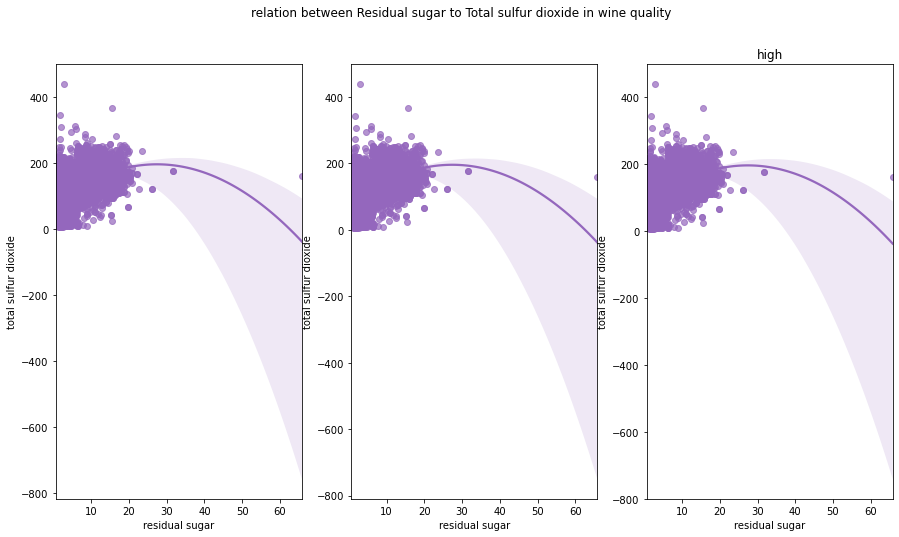

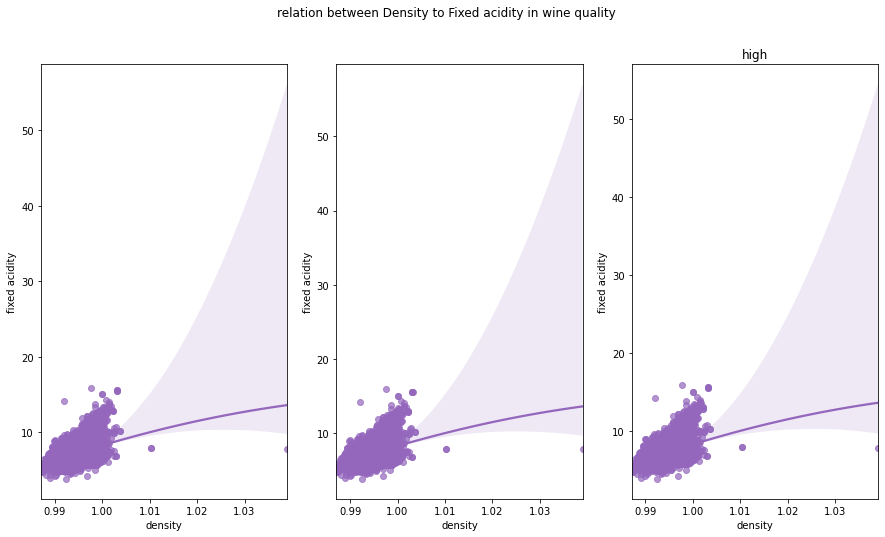

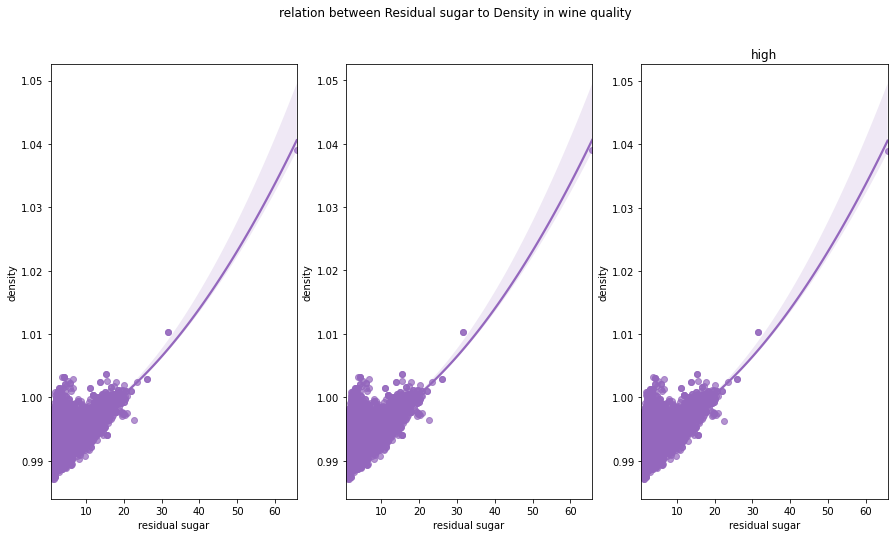

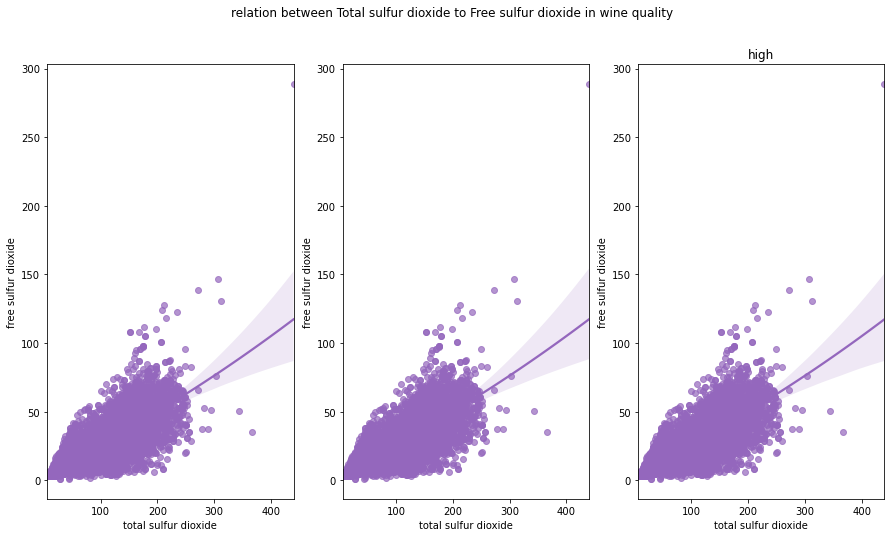

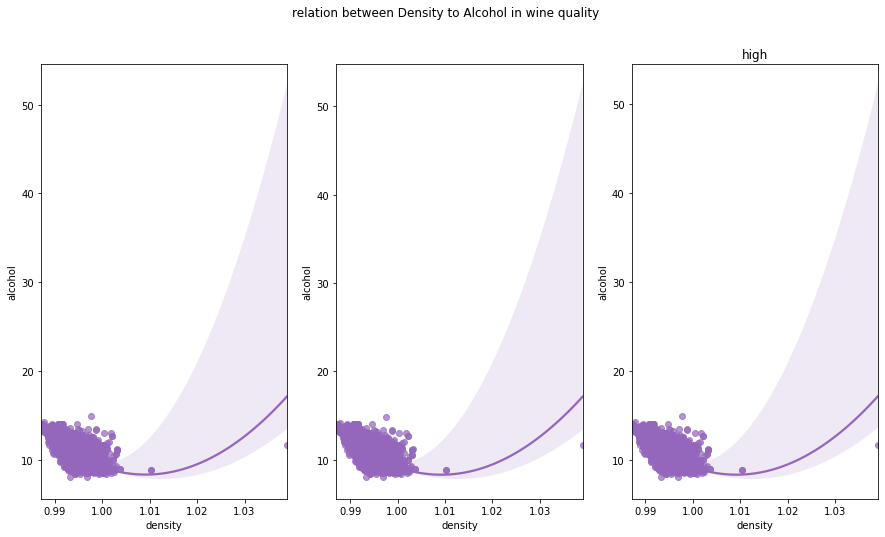

In [8]:
pairs = [('residual sugar', 'total sulfur dioxide'), ('density','fixed acidity'), ('residual sugar', 'density'), ('total sulfur dioxide','free sulfur dioxide'),('density','alcohol')]
quality_labels = ['low','medium','high']
# # def feature_grid()
# wine_features = list(df_wines.columns.unique())[:-4]

# fig, sub = plt.subplots(nrows = len(wine_features))
# for ind,feature in enumerate()
for pair in pairs:
        fig,axes = plt.subplots(nrows = 1, ncols = 3, figsize=(15,4))
        for ind,label in enumerate(quality_labels):
            sns.regplot(data = df_wines, x=f'{pair[0]}', y=f'{pair[1]}', order = 2, scatter_kws={'alpha':0.7},color='tab:purple', ax=axes[ind])
        fig.suptitle(f'relation between {pair[0].capitalize()} to {pair[1].capitalize()} in wine quality')
        axes[ind].set_title(f'Wine quality label: {label}')

        # g= sns.FacetGrid(df_wines,col = 'quality_label',col_order=['low','medium','high'], aspect = 1.2, height = 5.0)
        # g.map(sns.regplot, pair[0], pair[1], order=1, scatter_kws={'alpha':0.7},color='tab:purple')
        # # ax = g.ax
        # fig = g.fig
        # # fig.subplots_adjust(top=0.8,wspace=0.3)
        # plt.savefig(f'plots/reg/reg-{pair[0]}-{pair[1]}.png')

# for feature in wine_features:
#         g = sns.FacetGrid(df_wines,
#                         col="wine type",
#                         hue='quality_label',
#                         col_order=['red', 'white'],
#                         hue_order=['low', 'medium', 'high'],
#                         aspect=1.2,height=3.5)
#         g.map(sns.regplot,
#                 f"{feature}",
#                 "alcohol", order = 3, scatter_kws = {'alpha': 0.7   })
                
#         fig = g.fig
#         fig.subplots_adjust(top=0.8, wspace=0.3)
#         fig.suptitle(f'Wine Type - Alcohol - Quality - {feature.capitalize()}', fontsize=14)
#         l = g.add_legend(title='Wine Quality Class')